<!-- <div style='background-color: #fff7f7; border: 3px solid Red;'>
    <font size="+1" color="Red">
        <b>Please comment and upvote if you like this work!</b>
    </font>
</div>
<div style='background-color: #fff7f7; border: 3px solid Blue;'>
    <font size="+1" color="Red">
        <b>Take a look at the other notebooks in my profile ->
        <a href="https://www.kaggle.com/killa92/code">  Kaggle Notebooks </a></b>
    </font>
</div>    
<div style='background-color: #fff7f7; border: 3px solid yellow;'>
    <font size="+1" color="Red">
        <b><span style='color: green;'>Let's Support Each Other!!</span></b>
    </font>
</div> -->

<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>🗂️1. Install libraries and Download a pre-trained checkpoint 🗂️</b></font>
</div>

In [ ]:
!pip install ultralytics

In [ ]:
# import kagglehub
# kagglehub.login()

In [ ]:
# !kaggle datasets download -d sudipchakrabarty/kiit-mita -p ./militray_hardware

In [ ]:
# !sudo chmod 777 kiit-mita.zip 

In [ ]:
# !unzip /militray_hardware/kiit-mita.zip

In [2]:

from ultralytics import YOLO
model = YOLO("yolo11n.pt")

 <div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>📈 2. Data Analysis 📈</b></font>
</div>

In [3]:
import os, cv2, yaml, random, numpy as np
from PIL import Image
from glob import glob
from matplotlib import pyplot as plt
from torchvision import transforms as T

In [4]:
import os
from glob import glob
import yaml


def debug_directory(root):
    print(f"1. Checking if root exists: {os.path.exists(root)}")

    # Check YAML file
    yaml_path = os.path.join(root, "KIIT-MiTA.yml")
    print(f"\n2. Checking YAML file:")
    print(f"YAML path exists: {os.path.exists(yaml_path)}")
    if os.path.exists(yaml_path):
        with open(yaml_path, "r") as file:
            data = yaml.safe_load(file)
            print(f"YAML contents (names): {data.get('names', 'No names found')}")

    # Check directories and files
    for data_type in ["train", "valid", "test"]:
        print(f"\n3. Checking {data_type} directory:")

        # Check images directory
        image_dir = os.path.join(root, data_type, "images")
        print(f"{data_type}/images exists: {os.path.exists(image_dir)}")
        if os.path.exists(image_dir):
            images = glob(os.path.join(image_dir, "*"))
            print(f"Number of images found: {len(images)}")
            if images:
                print(f"First image path: {images[0]}")

        # Check labels directory
        label_dir = os.path.join(root, data_type, "labels")
        print(f"{data_type}/labels exists: {os.path.exists(label_dir)}")
        if os.path.exists(label_dir):
            labels = glob(os.path.join(label_dir, "*.txt"))
            print(f"Number of labels found: {len(labels)}")
            if labels:
                print(f"First label path: {labels[0]}")
                # Try to read first label file
                try:
                    with open(labels[0], "r") as f:
                        first_line = f.readline().strip()
                        print(f"First line of first label: {first_line}")
                except Exception as e:
                    print(f"Error reading label file: {e}")


# Run debug function
root = r"archive/KIIT-MiTA"  # or use "archive/KIIT-MiTA"
debug_directory(root)

1. Checking if root exists: True

2. Checking YAML file:
YAML path exists: True
YAML contents (names): ['Artilary', 'Missile', 'Radar', 'M. Rocket Launcher', 'Soldier', 'Tank', 'Vehicle']

3. Checking train directory:
train/images exists: True
Number of images found: 1360
First image path: archive/KIIT-MiTA/train/images/image_s3r2_kiit_137.jpeg
train/labels exists: True
Number of labels found: 1360
First label path: archive/KIIT-MiTA/train/labels/image_s3r2_kiit_218.txt
First line of first label: 2 0.515857 0.259141 0.034953 0.105621

3. Checking valid directory:
valid/images exists: True
Number of images found: 170
First image path: archive/KIIT-MiTA/valid/images/image_s3r2_kiit_1109.jpeg
valid/labels exists: True
Number of labels found: 170
First label path: archive/KIIT-MiTA/valid/labels/image_s3r2_kiit_947.txt
First line of first label: 3 0.616936 0.549822 0.766128 0.442152

3. Checking test directory:
test/images exists: True
Number of images found: 170
First image path: archive/K

Data analysis is in process...

Data analysis is in process...

Data analysis is in process...



/tmp/ipykernel_15633/2694165468.py:110: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(cls_names)
/tmp/ipykernel_15633/2694165468.py:110: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(cls_names)
/tmp/ipykernel_15633/2694165468.py:110: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(cls_names)


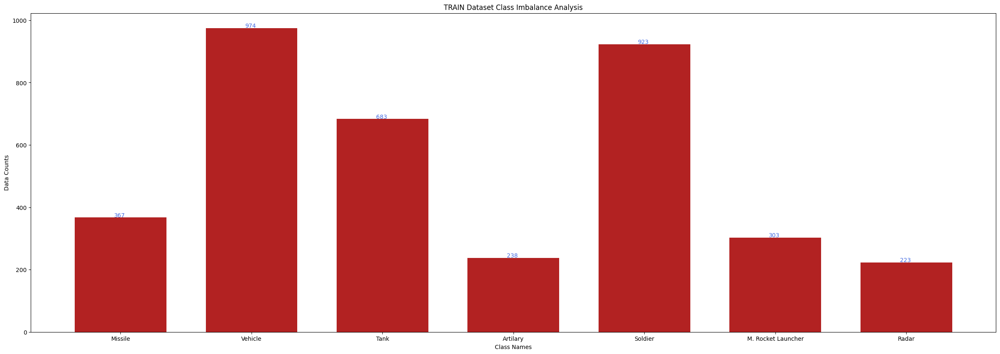

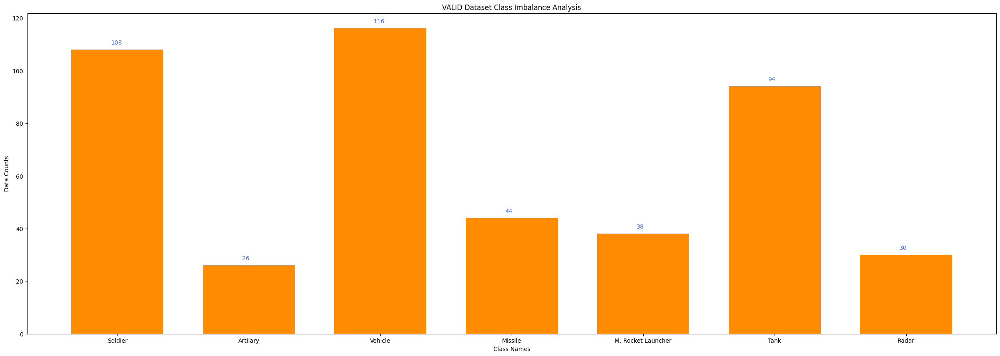

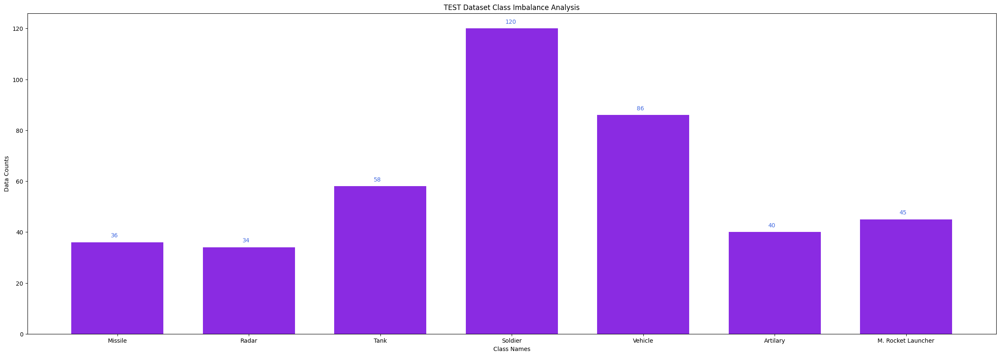

In [5]:
import os, cv2, yaml, random, numpy as np
from PIL import Image
from glob import glob
from matplotlib import pyplot as plt
from torchvision import transforms as T

class Visualization:

    def __init__(self, root, data_types, n_ims, rows, cmap = None):

        self.n_ims, self.rows = n_ims, rows
        self.cmap, self.data_types  = cmap, data_types
        self.colors = ["firebrick", "darkorange", "blueviolet"]
        
        self.get_cls_names(); self.get_bboxes()        
                
    def get_cls_names(self):

        with open(f"{root}/KIIT-MiTA.yml", 'r') as file: data = yaml.safe_load(file)      
        # Extract class names
        class_names = data['names']        
        
        # Create a dictionary with index as key and class name as value
        self.class_dict = {index: name for index, name in enumerate(class_names)}        
    
    def get_bboxes(self):

        self.vis_datas, self.analysis_datas, self.im_paths = {}, {}, {}
        for data_type in self.data_types:
            all_bboxes, all_analysis_datas = [], {}
            im_paths = glob(f"{root}/{data_type}/images/*")            
            
            for idx, im_path in enumerate(im_paths):
                # if idx == 3: break                
                bboxes = []
                im_ext = os.path.splitext(im_path)[-1]
                lbl_path = im_path.replace(im_ext, ".txt")
                lbl_path  = lbl_path.replace(f"{data_type}/images/", f"{data_type}/labels/")
                if not os.path.isfile(lbl_path): continue                
                meta_data = open(lbl_path).readlines()
                for data in meta_data:                    
                    # Split the string by space and strip the newline character
                    # Change here 
                    parts = data.strip().split()[:5]
                    cls_name = self.class_dict[int(parts[0])]
                    # Convert first element to integer and the rest to float
                    bboxes.append([cls_name] + [float(x) for x in parts[1:]])
                    if cls_name not in all_analysis_datas: all_analysis_datas[cls_name] = 1
                    else: all_analysis_datas[cls_name] += 1
                all_bboxes.append(bboxes)
                    
            self.vis_datas[data_type] = all_bboxes; self.analysis_datas[data_type] = all_analysis_datas; self.im_paths[data_type] = im_paths
    
    def plot(self, rows, cols, count, im_path, bboxes):
    
        plt.subplot(rows, cols, count)
        or_im = np.array(Image.open(im_path).convert("RGB"))
        height, width, _ = or_im.shape

        for bbox in bboxes:
            
            class_id, x_center, y_center, w, h = bbox

            # Convert YOLO format to pixel values
            x_min = int((x_center - w / 2) * width)  # x_min
            y_min = int((y_center - h / 2) * height)  # y_min
            x_max = int((x_center + w / 2) * width)  # x_max
            y_max = int((y_center + h / 2) * height)  # y_max
            
            color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
            cv2.rectangle(img = or_im, pt1 = (x_min, y_min), pt2 = (x_max, y_max), color = color, thickness = 3)
        plt.imshow(or_im)
        plt.axis("off"); plt.title(f"There is (are) {len(bboxes)} object(s) in the image.")
        
        return count + 1

    def vis(self, save_name):

        print(f"{save_name.upper()} Data Visualization is in process...\n")
        assert self.cmap in ["rgb", "gray"], "Please choose rgb or gray cmap"
        if self.cmap == "rgb": cmap = "viridis"
        cols = self.n_ims // self.rows; count = 1
        
        plt.figure(figsize = (25, 20))
                
        indices = [random.randint(a = 0, b = len(self.vis_datas[save_name]) - 1) for _ in range(self.n_ims)]

        for idx, index in enumerate(indices):
        
            if count == self.n_ims + 1: break
            
            im_path, bboxes = self.im_paths[save_name][index], self.vis_datas[save_name][index]

            count = self.plot(self.rows, cols, count, im_path = im_path, bboxes = bboxes)
            
        plt.show()

    def data_analysis(self, save_name, color):

        print("Data analysis is in process...\n")
        
        width, text_width, text_height = 0.7, 0.05, 2
        cls_names = list(self.analysis_datas[save_name].keys()); counts = list(self.analysis_datas[save_name].values())
        
        _, ax = plt.subplots(figsize = (30, 10))
        indices = np.arange(len(counts))

        ax.bar(indices, counts, width, color = color)
        ax.set_xlabel("Class Names", color = "black")
        ax.set_xticklabels(cls_names)
        ax.set(xticks = indices, xticklabels = cls_names)
        ax.set_ylabel("Data Counts", color = "black")
        ax.set_title(f"{save_name.upper()} Dataset Class Imbalance Analysis")

        for i, v in enumerate(counts): ax.text(i - text_width, v + text_height, str(v), color = "royalblue")
    
    def visualization(self): [self.vis(save_name) for save_name in self.data_types]
        
    def analysis(self): [self.data_analysis(save_name, color) for (save_name, color) in zip(self.data_types, self.colors)]
        
root = r"archive/KIIT-MiTA"
vis = Visualization(root = root, data_types = ["train", "valid", "test"], n_ims = 20, rows = 5, cmap = "rgb")
vis.analysis()

<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>📊 3. Data Visualization 📊</b></font>
</div>

TRAIN Data Visualization is in process...



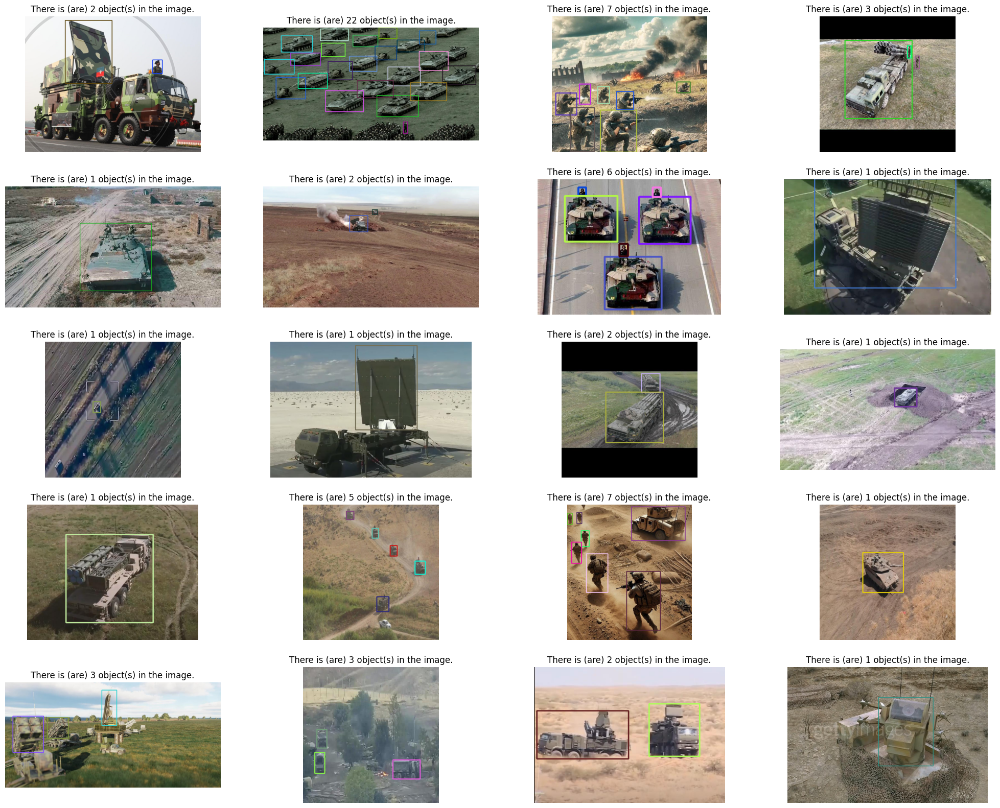

VALID Data Visualization is in process...



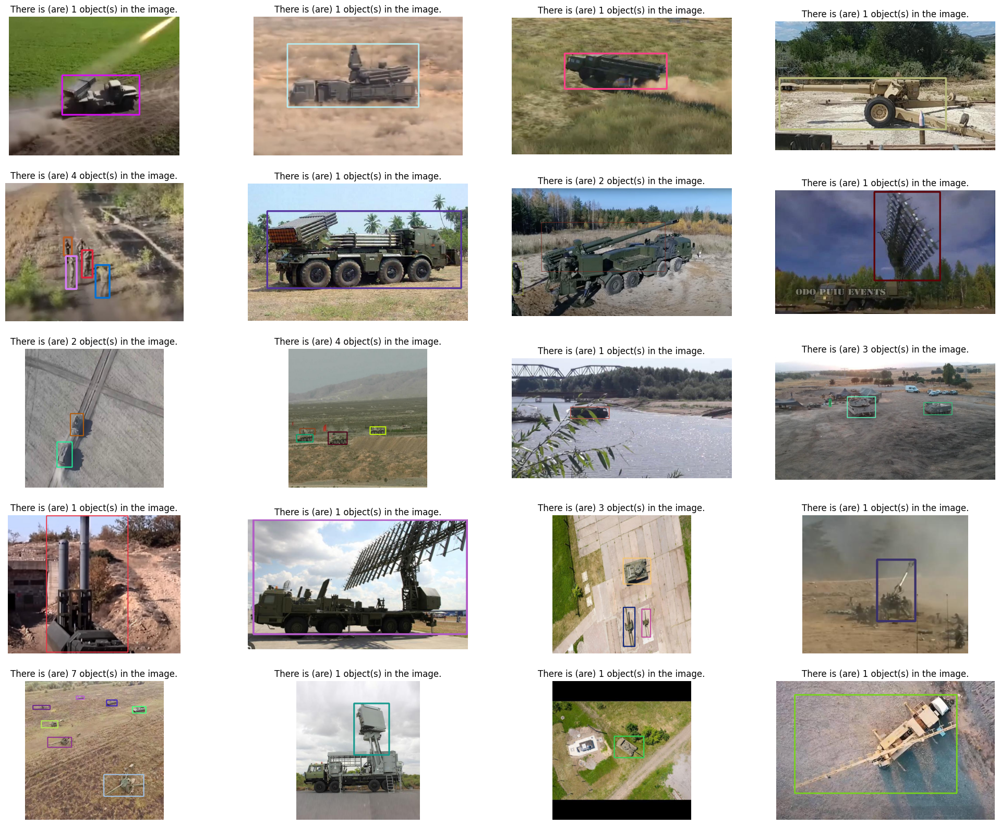

TEST Data Visualization is in process...



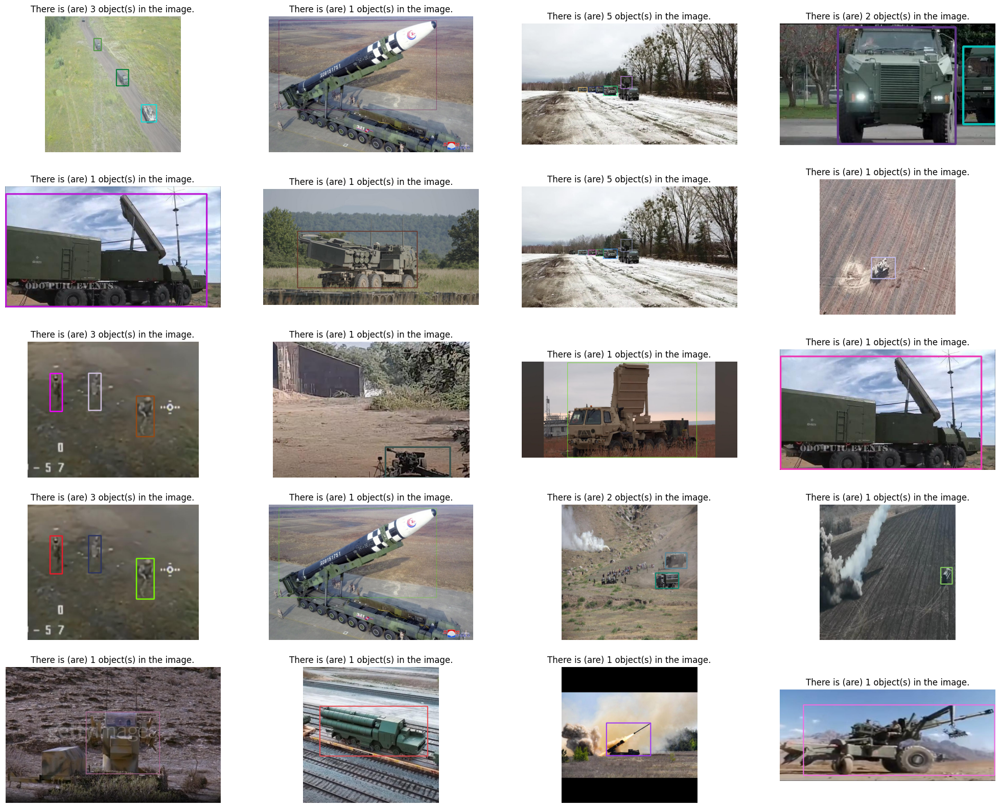

In [6]:
vis.visualization()

<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>✨ 4. AI Model Train✨</b></font>
</div>

In [7]:
import torch
print(f"CUDA available: {torch.cuda.is_available()}")
print(f"CUDA version: {torch.version.cuda}")

CUDA available: True
CUDA version: 12.4


In [9]:
# Load YAML content into a Python dictionary
yml_file_path = f"{root}/KIIT-MiTA.yml"

with open(yml_file_path, 'r') as file:
    data = yaml.safe_load(file)
# Update the paths
data['train'] = 'archive/KIIT-MiTA/train/images'
data['val'] = 'archive/KIIT-MiTA/valid/images'
data['test'] = 'archive/KIIT-MiTA/test/images'

print(data)
# Save the updated YAML content to a file
output_path = 'updated_config.yml'
with open(output_path, 'w') as file: yaml.dump(data, file, default_flow_style=False)

train_results = model.train(
    # data=f"{root}/KIIT-MiTA.yml",  # path to dataset YAML
    data="updated_config.yml",
    epochs=30,  # number of training epochs
    imgsz=480,  # training image size
    device=[0])  # device to run on, i.e. device=0 or device=0,1,2,3 or device=cpu

{'names': ['Artilary', 'Missile', 'Radar', 'M. Rocket Launcher', 'Soldier', 'Tank', 'Vehicle'], 'nc': 7, 'train': '/home/nic/workspace/Mlops/M_H_D/Military_Object_Detection/archive/KIIT-MiTA/train/images', 'val': '/home/nic/workspace/Mlops/M_H_D/Military_Object_Detection/archive/KIIT-MiTA/valid/images', 'test': '/home/nic/workspace/Mlops/M_H_D/Military_Object_Detection/archive/KIIT-MiTA/test/images'}
New https://pypi.org/project/ultralytics/8.3.64 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.59 🚀 Python-3.9.21 torch-2.5.1+cu124 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=updated_config.yml, epochs=30, time=None, patience=100, batch=16, imgsz=480, save=True, save_period=-1, cache=False, device=[0], workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=

train: Scanning /home/nic/workspace/Mlops/M_H_D/Military_Object_Detection/archive/KIIT-MiTA/train/labels.cache... 1360 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1360/1360 [00:00<?, ?it/s]Scanning /home/nic/workspace/Mlops/M_H_D/Military_Object_Detection/archive/KIIT-MiTA/train/labels.cache... 1360 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1360/1360 [00:00<?, ?it/s]
val: Scanning /home/nic/workspace/Mlops/M_H_D/Military_Object_Detection/archive/KIIT-MiTA/valid/labels.cache... 170 images, 0 backgrounds, 0 corrupt: 100%|██████████| 170/170 [00:00<?, ?it/s]Scanning /home/nic/workspace/Mlops/M_H_D/Military_Object_Detection/archive/KIIT-MiTA/valid/labels.cache... 170 images, 0 backgrounds, 0 corrupt: 100%|██████████| 170/170 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000909, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 480 train, 480 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30       1.4G      1.384      3.416      1.268         85        480: 100%|██████████| 85/85 [00:11<00:00,  7.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.40it/s]


                   all        170        456      0.352      0.122      0.173      0.103

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30       1.4G       1.44      2.515      1.326         80        480: 100%|██████████| 85/85 [00:09<00:00,  8.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.54it/s]


                   all        170        456      0.301      0.387      0.284      0.164

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30       1.4G      1.479      2.296      1.337         71        480: 100%|██████████| 85/85 [00:06<00:00, 12.48it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  8.03it/s]


                   all        170        456      0.289        0.4      0.285      0.159

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      1.39G      1.467      2.237      1.329         69        480: 100%|██████████| 85/85 [00:09<00:00,  9.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.89it/s]


                   all        170        456      0.265      0.398       0.28      0.156

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      1.41G      1.448      2.091      1.325         73        480: 100%|██████████| 85/85 [00:09<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.99it/s]


                   all        170        456      0.412      0.406      0.399      0.231

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      1.41G      1.384      1.977      1.272         86        480: 100%|██████████| 85/85 [00:06<00:00, 12.81it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.28it/s]


                   all        170        456      0.413      0.411      0.373      0.213

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      1.42G       1.38      1.932      1.267         78        480: 100%|██████████| 85/85 [00:09<00:00,  9.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.84it/s]


                   all        170        456      0.494      0.436      0.398      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      1.39G      1.338      1.809      1.239         72        480: 100%|██████████| 85/85 [00:09<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.32it/s]


                   all        170        456      0.466      0.386      0.406      0.234

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      1.38G      1.341       1.77      1.238         96        480: 100%|██████████| 85/85 [00:07<00:00, 12.03it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.10it/s]


                   all        170        456      0.469      0.487      0.435      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      1.43G      1.328      1.742       1.24         74        480: 100%|██████████| 85/85 [00:09<00:00,  8.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.15it/s]


                   all        170        456      0.463      0.509      0.452      0.264

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      1.42G      1.274      1.624      1.199         92        480: 100%|██████████| 85/85 [00:11<00:00,  7.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [-1:59:59<00:00, -3.60it/s]


                   all        170        456      0.539      0.434      0.465      0.276

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      1.38G      1.278      1.607      1.213         87        480: 100%|██████████| 85/85 [00:10<00:00,  8.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.59it/s]


                   all        170        456      0.496      0.511      0.496      0.305

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      1.42G      1.255      1.556      1.195         95        480: 100%|██████████| 85/85 [00:10<00:00,  8.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.27it/s]


                   all        170        456      0.474      0.505      0.492        0.3

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      1.41G      1.256      1.512      1.196         73        480: 100%|██████████| 85/85 [00:07<00:00, 10.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.37it/s]


                   all        170        456      0.599      0.508      0.538      0.335

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      1.42G      1.219      1.474      1.172         81        480: 100%|██████████| 85/85 [00:10<00:00,  7.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.15it/s]


                   all        170        456      0.544      0.546      0.552      0.335

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30       1.4G      1.216      1.404      1.179         94        480: 100%|██████████| 85/85 [00:11<00:00,  7.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.11it/s]


                   all        170        456      0.624      0.491      0.513       0.31

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      1.38G      1.172      1.373      1.156         76        480: 100%|██████████| 85/85 [00:08<00:00, 10.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.93it/s]


                   all        170        456      0.584      0.537      0.556      0.353

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      1.38G       1.18      1.361      1.162         95        480: 100%|██████████| 85/85 [00:10<00:00,  8.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.64it/s]


                   all        170        456      0.624      0.515      0.584      0.363

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      1.37G      1.167      1.308      1.143         53        480: 100%|██████████| 85/85 [00:10<00:00,  8.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.88it/s]


                   all        170        456      0.593       0.58      0.607      0.376

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      1.39G      1.161      1.277      1.141         90        480: 100%|██████████| 85/85 [00:07<00:00, 11.36it/s]  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.57it/s]


                   all        170        456      0.638      0.585      0.614       0.39
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      1.38G       1.09      1.207      1.098         42        480: 100%|██████████| 85/85 [00:11<00:00,  7.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.50it/s]


                   all        170        456      0.599      0.614      0.602      0.383

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      1.39G      1.069      1.141      1.086         35        480: 100%|██████████| 85/85 [00:07<00:00, 11.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.92it/s]


                   all        170        456      0.624      0.588      0.625      0.403

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      1.38G       1.05       1.08       1.08         49        480: 100%|██████████| 85/85 [00:11<00:00,  7.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.68it/s]


                   all        170        456      0.692      0.547      0.625      0.396

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      1.37G      1.042      1.065      1.066         42        480: 100%|██████████| 85/85 [00:09<00:00,  8.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.29it/s]


                   all        170        456      0.716      0.575       0.65      0.414

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      1.38G      1.018      1.012      1.051         28        480: 100%|██████████| 85/85 [00:07<00:00, 11.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.24it/s]


                   all        170        456      0.666      0.576      0.632      0.395

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      1.38G      1.019      1.002      1.061         29        480: 100%|██████████| 85/85 [00:10<00:00,  8.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.88it/s]


                   all        170        456      0.639      0.617      0.631       0.41

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      1.38G     0.9872     0.9404       1.03         34        480: 100%|██████████| 85/85 [00:10<00:00,  8.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.13it/s]


                   all        170        456      0.637      0.645      0.667      0.429

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      1.37G     0.9714     0.9156      1.026         31        480: 100%|██████████| 85/85 [00:07<00:00, 12.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.05it/s]


                   all        170        456      0.734      0.562      0.656      0.429

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      1.38G     0.9576     0.8876      1.015         24        480: 100%|██████████| 85/85 [00:10<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.90it/s]


                   all        170        456      0.662      0.609      0.653      0.435

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      1.37G     0.9397     0.8634      1.009         44        480: 100%|██████████| 85/85 [00:10<00:00,  8.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.72it/s]


                   all        170        456      0.762      0.533      0.658      0.438

30 epochs completed in 0.089 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.4MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.4MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.59 🚀 Python-3.9.21 torch-2.5.1+cu124 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
YOLO11n summary (fused): 238 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00, -12.92it/s]


                   all        170        456      0.762      0.533      0.657      0.438
              Artilary         19         26      0.797      0.538      0.662      0.407
               Missile         25         44      0.815      0.614      0.729      0.495
                 Radar         27         30      0.614      0.433      0.513      0.302
    M. Rocket Launcher         28         38      0.864        0.5      0.734       0.61
               Soldier         35        108      0.805        0.5      0.595      0.333
                  Tank         37         94      0.788      0.595      0.737      0.496
               Vehicle         47        116      0.653      0.552      0.628      0.422
Speed: 0.2ms preprocess, 1.8ms inference, 0.0ms loss, 3.4ms postprocess per image
Results saved to runs/detect/train


SCMError: Could not apply stash commit

<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>😍 5. Learning Curves 😍</b></font>
</div>

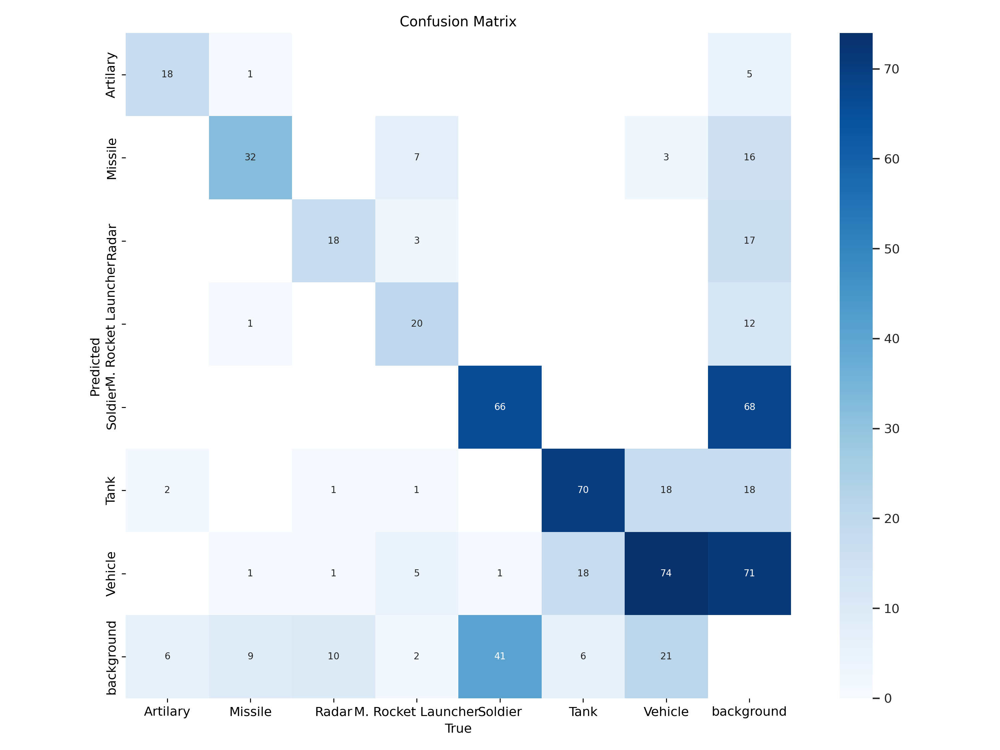

In [10]:
Image.open(f"runs/detect/train/confusion_matrix.png")

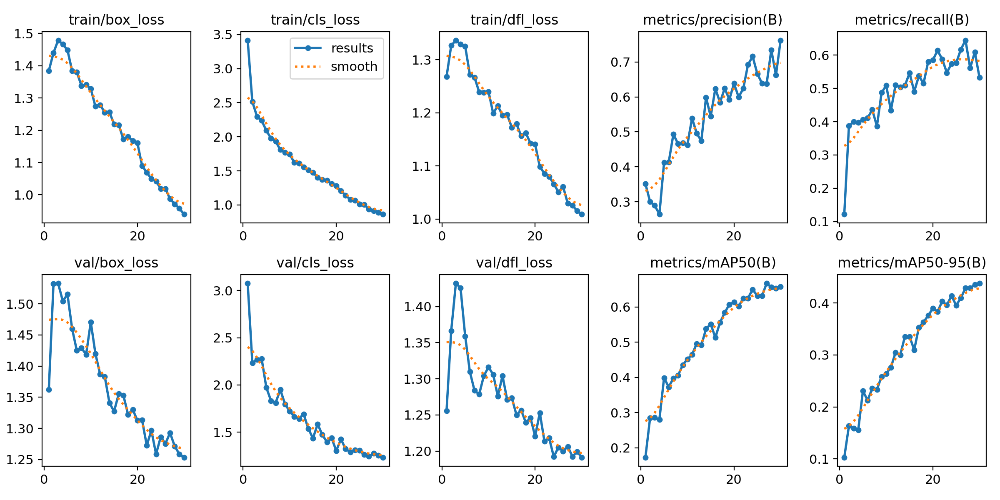

In [11]:
Image.open(f"runs/detect/train/results.png")

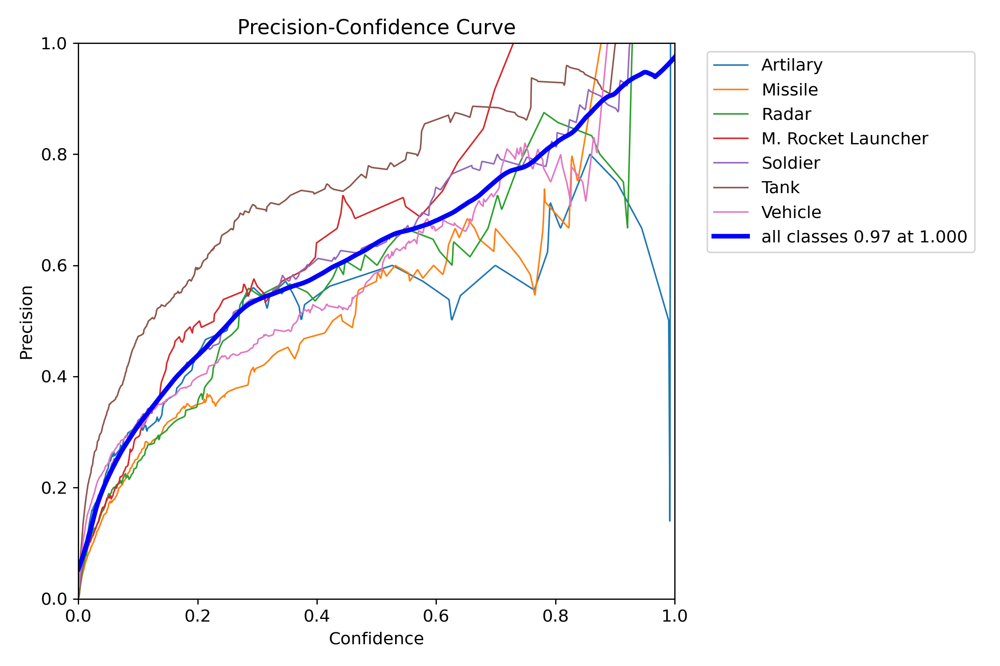

In [7]:
Image.open(f"runs/detect/train/P_curve.png")

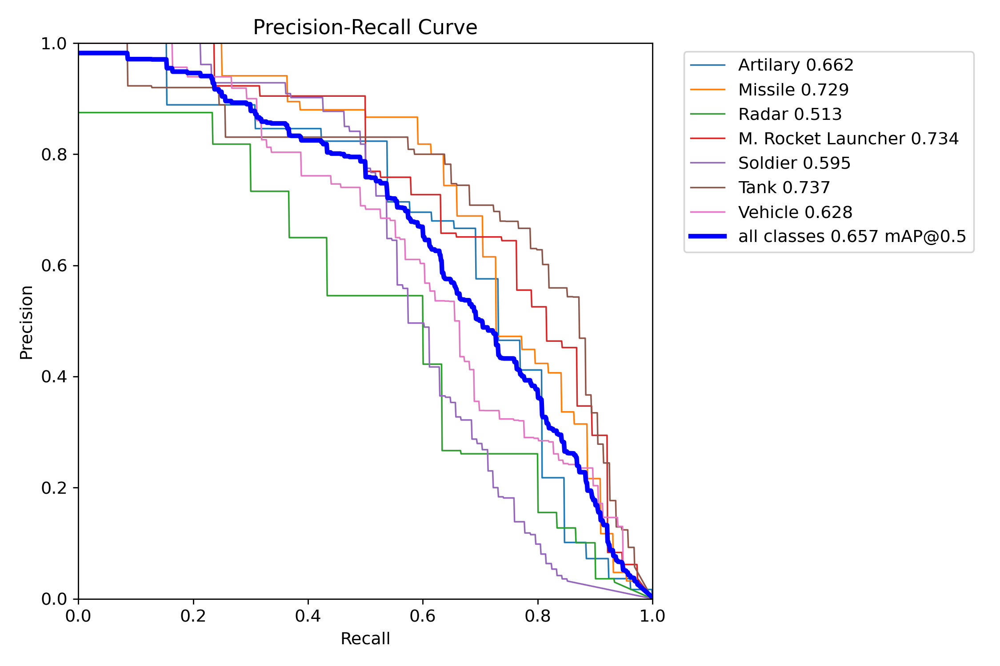

In [12]:
Image.open(f"runs/detect/train/PR_curve.png")

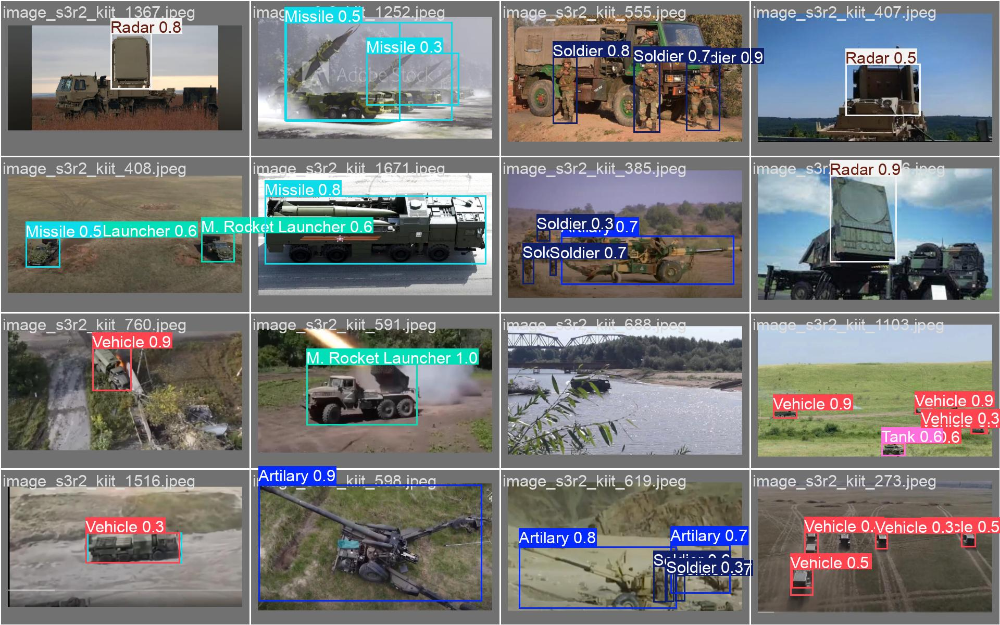

In [13]:
Image.open(f"runs/detect/train/val_batch0_pred.jpg")

<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>✅6. Inference with Test Dataset✅</b></font>
</div>

In [15]:
inference_results = model("archive/KIIT-MiTA/test/images", device = 0, verbose = False)

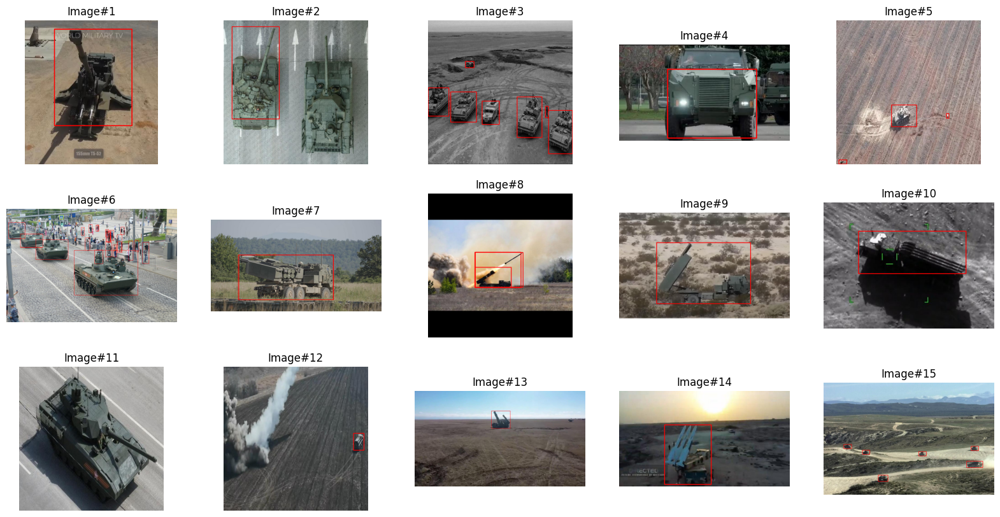

In [16]:
def inference_vis(res, n_ims, rows):
    cols = n_ims // rows
    plt.figure(figsize = (20, 10))
    for idx, r in enumerate(res):
        if idx == n_ims: break
        plt.subplot(rows, cols, idx + 1)
        or_im_rgb = np.array(Image.open(r.path).convert("RGB"))
        if idx == n_ims: break    
        for i in r:
            for bbox in i.boxes:
                box = bbox.xyxy[0]
                x1, y1, x2, y2 = box
                coord1, coord2 = (int(x1), int(y1)), (int(x2), int(y2))
                cv2.rectangle(or_im_rgb, coord1, coord2, color=(255,0,0), thickness=2)
        plt.imshow(or_im_rgb)
        plt.title(f"Image#{idx + 1}")
        plt.axis("off")
inference_vis(res = inference_results, n_ims = 15, rows = 3)